# Audio-Score Alignment for Traditional Flute Musical Pieces

### The idea behind this notebook is to present results of the Audio-Score Alignment algorithm (developed within my master's in science thesis) as a perceptual experience. 

By listening a mixture of original audio and the synthesis of the alignment, the result can be perceptually evaluated and serves as a way of comparing algorithm and parameter influence.

First, some important packages importing and path variable definition:

In [1]:
import sys
sys.path.append('./traditional_dataset/')
sys.path.append('./melosynth/')
import fastdtw 
import IPython.display
import numpy as np
import matplotlib.pyplot as plt
import librosa as lr
import load as ld
import utils 
from scipy.spatial.distance import cosine 
from scipy.spatial.distance import euclidean
import melosynth as ms

Next the first part of code's main body, where parameters of the algorithm are selected. 

In [2]:
if __name__=="__main__":
   
    #distance function param
    distancefun_param = ['cosine', 'euclidean']
    distancefun = distancefun_param[0]
    print('distance: ' + distancefun)
    
    #bins params
    bins_param = [12, 24, 36]
    bins = bins_param[1]
    print('bins per octave: ' + str(bins))
    
    #range param: flute register
    end_note = lr.note_to_midi('B9')
    range_bins = lr.note_to_midi('B9') - lr.note_to_midi('B3')
    
    #harmonics param
    harmonics_param = [0, 1, 2, 3, 4, 5, 6]
    harmonics = harmonics_param[1]
    #print('harmonics in score codification: ' + str(harmonics))
 
    #windows params
    hop_param = [128, 256, 512, 1024, 2048, 4096]
    hop = hop_param[1]
    print('hop size: ' + str(hop))

distance: cosine
bins per octave: 24
hop size: 256


In the cell below, the loop with the selected fragments for perceptual evaluation is implemented. It can be seen the files loading lines, intermediate representation generation and alignment computation. Plots for each fragment are displayed and aligment synthesis are done too.

harmonics: 1


/home/jbraga/anaconda2/lib/python2.7/site-packages/librosa/core/time_frequency.py:538: RuntimeWarning: divide by zero encountered in log2
  return 12 * (np.log2(np.atleast_1d(frequencies)) - np.log2(440.0)) + 69


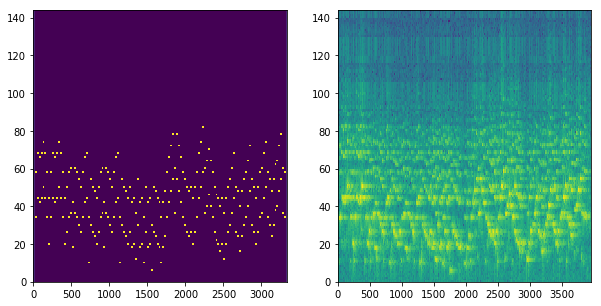

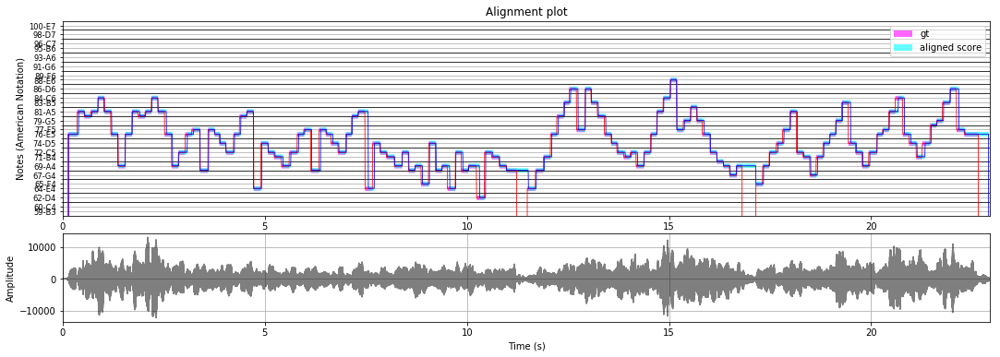

INFO:Loading data...
INFO:Generating wave...
INFO:Saving wav file...


harmonics: 4


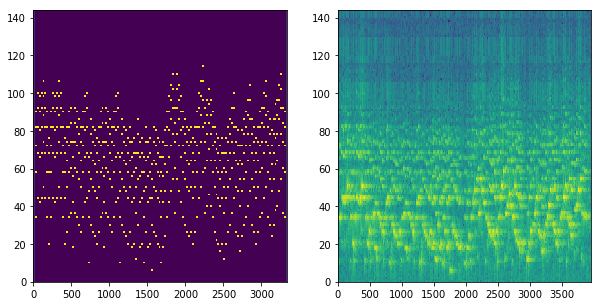

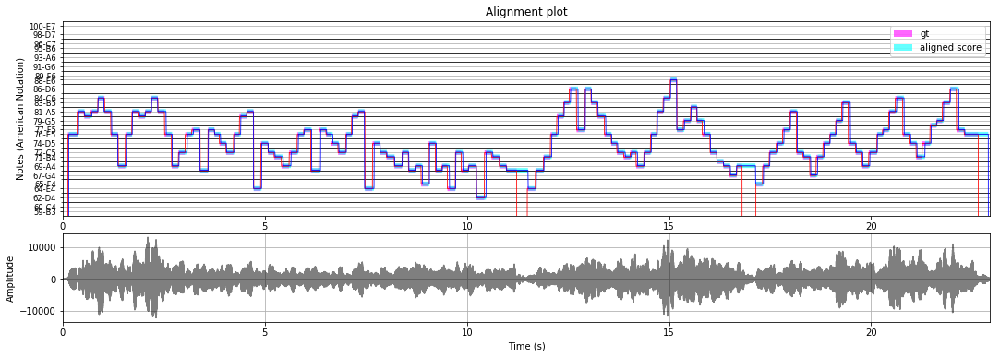

INFO:Loading data...
INFO:Generating wave...
INFO:Saving wav file...


harmonics: 6


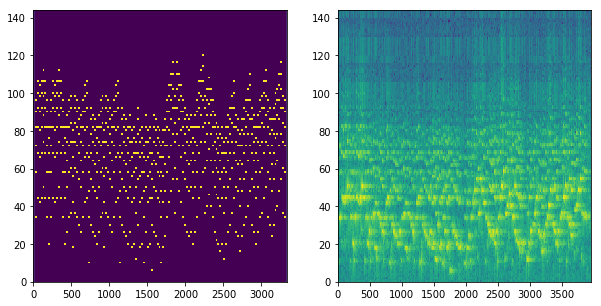

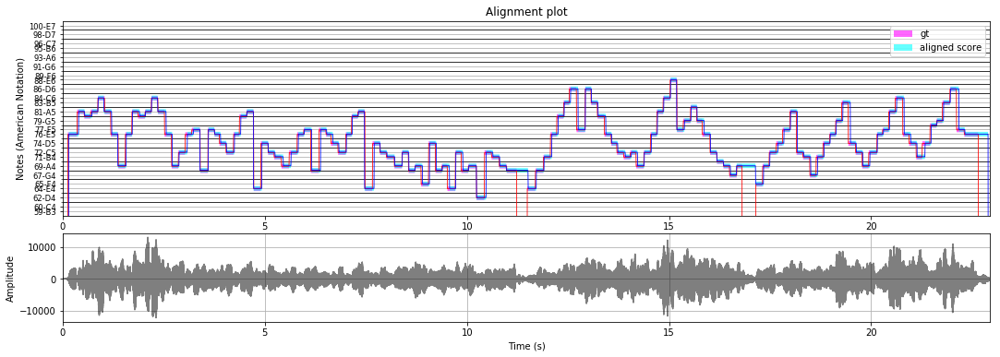

INFO:Loading data...
INFO:Generating wave...
INFO:Saving wav file...


In [3]:
    #FRAGMENT SELECTION
    
    fragments = ld.list_of_fragments('./traditional_dataset/dataset.csv')
    fragment = fragments[0]
    
    for harmonics in [harmonics_param[1], harmonics_param[4], harmonics_param[6]]:
        
        print('harmonics: ' + str(harmonics)) 
        
        #FILES LOADING
        #audio
        audio_file = './traditional_dataset/audio/' + fragment + '.wav'
        audio, t, fs = ld.audio(audio_file)

        #ground truth
        gt_file = './traditional_dataset/ground_truth/' + fragment + '.gt'
        gt_onset, gt_note, gt_duration = ld.ground_truth(gt_file)
        gt_note=lr.hz_to_midi(gt_note)
        gt_note[np.isinf(gt_note)]=0    
        gt_array, gt_t, gt_index = ld.to_array(gt_onset, gt_note, gt_duration, fs, hop)

        #score
        score_file = './traditional_dataset/score/' + fragment[0:fragment.rfind('_')] + '.notes'
        score_onset, score_note, score_duration = ld.score(score_file)
        score_array, score_t, score_index = ld.to_array(score_onset, score_note, score_duration, fs, hop)
        
                #generate both intermediate representations 
        note_fb = utils.note_filter(score_array, resolution_octave=(bins/12), harmonics=harmonics)         

        C, dummy1, dummy2 = lr.core.cqt(audio, sr=fs, hop_length=hop, fmin=lr.note_to_hz('B3'),
                        n_bins=range_bins*(bins/12),bins_per_octave=bins,tuning=None, 
                        filter_scale=1,sparsity=0.3, norm=1, scale=True)

        Cxx = np.abs(C) + 0.001      

        utils.intermediate_representation_plot(note_fb,Cxx)
                
        #DTW
    
        if distancefun == 'cosine':
            distfun = cosine
        elif distancefun == 'euclidean':
            distfun = euclidean

        distance, path, dummy = fastdtw.fastdtw(Cxx.T[:(len(gt_array)-Cxx.shape[1]),:], note_fb.T, dist=distfun)
        path = np.array(path)

        #ALIGNMENT PLOTTING

        utils.alignment_plot(gt_array,gt_t,score_array,path,audio,t)
        
        align_result = score_array[path[:,1]] 
        align_synth_filename = fragment + '_' + str(harmonics) + '_alignment_synth.wav'
        ms.melosynth_pitch(lr.midi_to_hz(score_array[path[:,1]]), gt_t[path[:,0]], align_synth_filename, fs=44100, nHarmonics=3, square=True, useneg=False) 
 

### Perceptual experiment: result and original audio are played together

Finally, the perceptual evaluation can be held with the cells below. It has been selected one fragment of the [Traditional Flute Dataset][1] (follow the link for downloading the dataset) and the alignment computed with different hop sizes. It is recommended to listen to the result by watching simultaneously to the correspondent plot above.


[1]: https://www.kaggle.com/jbraga/traditional-flute-dataset

#### BWV 1013 Allemande first fragment with harmonics = 2:

In [7]:
    harmonics = harmonics_param[1]
    aligned_file = fragment + '_' + str(harmonics) + '_alignment_synth.wav'
    audio_file = './traditional_dataset/audio/' + fragment + '.wav'
    aligned_audio, t, fs = ld.audio(aligned_file)
    audio, t, fs = ld.audio(audio_file)
       
    IPython.display.Audio([0.1*aligned_audio,audio[:aligned_audio.shape[0]]], rate=fs)

#### BWV 1013 Allemande first fragment with harmonics = 5:

In [8]:
    harmonics = harmonics_param[4]
    aligned_file = fragment + '_' + str(harmonics) + '_alignment_synth.wav'
    audio_file = './traditional_dataset/audio/' + fragment + '.wav'
    aligned_audio, t, fs = ld.audio(aligned_file)
    audio, t, fs = ld.audio(audio_file)
       
    IPython.display.Audio([0.1*aligned_audio,audio[:aligned_audio.shape[0]]], rate=fs)

#### BWV 1013 Allemande first fragment with harmonics = 7:

In [9]:
    harmonics = harmonics_param[6]
    aligned_file = fragment + '_' + str(harmonics) + '_alignment_synth.wav'
    audio_file = './traditional_dataset/audio/' + fragment + '.wav'
    aligned_audio, t, fs = ld.audio(aligned_file)
    audio, t, fs = ld.audio(audio_file)
       
    IPython.display.Audio([0.1*aligned_audio,audio[:aligned_audio.shape[0]]], rate=fs)